In [1]:
import numpy as np
import matplotlib.pyplot as pl
import starry
import emcee
from tqdm import tqdm
from ylm_rot import get_ylm_coeffs
import corner
%matplotlib inline
%config InlineBackend.figure_format = "retina"
from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["figure.dpi"] = 100

## RV data from HARPS

In [2]:
time, rv = np.loadtxt("HD189733_rvs_harps.txt", unpack=True, skiprows=1, delimiter=',')
idx = np.argsort(time)
time = time[idx]
rv = rv[idx]

## Define our priors

In [3]:
class Normal(object):
    """Sample from a normal distribution."""
    def __init__(self, mean, sigma):
        self.mean = mean
        self.sigma = sigma
    def sample(self):
        return self.mean + self.sigma * np.random.randn()
    def evaluate(self, x):
        return -0.5 * (x - self.mean) ** 2 / self.sigma ** 2

class Uniform(object):
    """Sample from a uniform distribution."""
    def __init__(self, low, high):
        self.low = low
        self.high = high
    def sample(self):
        return np.random.uniform(self.low, self.high)
    def evaluate(self, x):
        if (x < self.low) or (x > self.high):
            return -np.inf
        else:
            return 0

class Sine(object):
    """Sample from a sine distribution."""
    def __init__(self):
        pass
    def sample(self):
        x = np.random.random()
        y = np.arccos(1 - x) * 180 / np.pi
        z = np.random.random()
        if z < 0.5:
            return 180 - y
        else:
            return y
    def evaluate(self, x):
        if x < 0 or x > 180:
            return -np.inf
        else:
            return np.log10(np.sin(x * np.pi / 180))

In [4]:
class Prior:
    # Planet parameters from Table 1 in Cegla et al. (2016)
    # Generous uniform priors for the other stuff
    def __init__(self):
        self.params = ['veq', 'obl', 'inc', 'alpha', 'u1', 
                       'baseline', 'K', 'b_t0', 'b_per', 
                       'b_inc', 'b_r', 'b_a', 'ln_err']
        self.names = [r'$v_\mathrm{eq}$',
                      r'$\lambda$',
                      r'$i$',
                      r'$\alpha$',
                      r'$u_1$',
                      r'$v_\mathrm{0}$',
                      r'$K$',
                      r'$t_\mathrm{0,p}$',
                      r'$P_\mathrm{p}$',
                      r'$i_\mathrm{p}$',
                      r'$r_\mathrm{p}$',
                      r'$a$',
                      r'$\ln\sigma_\mathrm{RV}$']
        
        self.veq = Uniform(0, 1e4)
        self.obl = Uniform(-90, 90)
        self.inc = Sine()
        self.alpha = Uniform(-1, 1)
        self.u1 = Normal(0.816, 0.019)
        self.baseline = Uniform(-5000, -4000)
        self.K = Normal(200.56, 0.88)
        self.b_t0 = Normal(2454279.436714, 0.000015)
        self.b_per = Normal(2.21857567, 0.00000015)
        self.b_inc = Normal(85.710, 0.024)
        self.b_r = Normal(0.15667, 0.00012)
        self.b_a = Normal(8.863, 0.020)
        self.ln_err = Uniform(-3, 3)
        
        self.veq_guess = Normal(4500, 100)
        self.obl_guess = Normal(-0.4, 0.3)
        self.inc_guess = Normal(100, 2.0)
        self.alpha_guess = Uniform(-0.5, 0.5)
        self.u1_guess = Normal(0.816, 0.019)
        self.baseline_guess = Normal(-4195.0, 3.0)
        self.K_guess = Normal(200.56, 0.88)
        self.b_t0_guess = Normal(2454279.436714, 0.000015)
        self.b_per_guess = Normal(2.21857567, 0.00000015)
        self.b_inc_guess = Normal(85.710, 0.024)
        self.b_r_guess = Normal(0.15667, 0.00012)
        self.b_a_guess = Normal(8.863, 0.020)
        self.ln_err_guess = Normal(0, 0.1)
        
    def evaluate(self, x):
        return np.sum([getattr(self, p).evaluate(x[i]) for i, p in enumerate(self.params)])

    def sample(self):
        return [getattr(self, p).sample() for i, p in enumerate(self.params)]
    
    def guess(self):
        return [getattr(self, p + "_guess").sample() for i, p in enumerate(self.params)]
    
prior = Prior()

## Define our model and likelihood

In [5]:
# Instantiate our `starry` system
star = starry.kepler.Primary(4)
planet = starry.kepler.Secondary(0)
system = starry.kepler.System(star, planet)
map_unif = starry.Map(1)

In [6]:
def compute(x):
    # Get our params
    veq, obl, inc, alpha, u1, baseline, K, b_t0, b_per, b_inc, b_r, b_a, ln_err = x
    
    # Planet params
    planet.tref = b_t0
    planet.porb = b_per
    # HACK: I think Cegla et al. assume the planet transits 
    # across the northern hemisphere. Let's force that here.
    planet.inc = 180 - b_inc
    planet.r = b_r
    planet.a = b_a
    
    # Stellar velocity profile
    star.reset()
    star[:3, :] += veq * get_ylm_coeffs(inc=inc, obl=obl, alpha=np.abs(alpha))
    star[1] = u1
    
    # Compute the light curve
    system.compute(time)

    # HACK: STARRY currently requires the Y_{0,0} coefficient for the star to be
    # unity. But if we're using it to model velocity, we want the net velocity of
    # the star to be *zero* (after subtracting the orbital slope). We can hack this
    # by subtracting the model for a transit across a uniform star, like this:
    f_unif = map_unif.flux(xo=planet.X, yo=planet.Y, ro=planet.r)
    model = star.lightcurve / np.pi - f_unif
    
    # Add a baseline
    model += baseline - K * np.sin(2 * np.pi / b_per * (time - b_t0))
    
    return model

In [7]:
def lnlike(x):
    # Evaluate the prior
    lp = prior.evaluate(x)
    if np.isinf(lp):
        return lp
    
    # Compute the model
    model = compute(x)
    
    # Compute the likelihood from chi-squared
    ln_err = x[-1]
    N = len(time)
    return lp - 0.5 * np.sum(((model - rv) / np.exp(ln_err)) ** 2) - N * ln_err

## Sample from the "guess" a few times

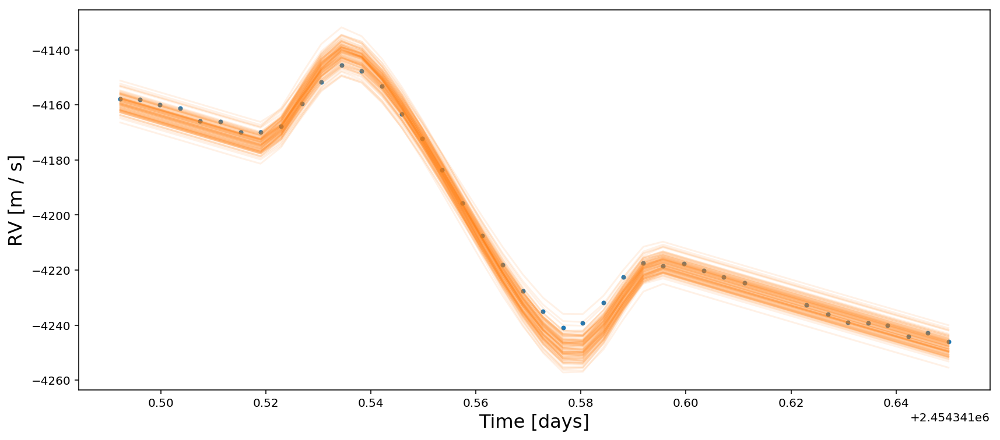

In [8]:
fig = pl.figure(figsize=(14, 6))
pl.plot(time, rv, '.')
pl.xlabel("Time [days]", fontsize=16)
pl.ylabel("RV [m / s]", fontsize=16);

for i in range(100):
    model = compute(prior.guess())
    pl.plot(time, model, 'C1', alpha=0.1)

## Let's do MCMC

In [9]:
# Chain params
nsteps = 50000
nwalk = 80
ndim = 13

# Initial guesses
p0 = [prior.guess() for k in range(nwalk)]

# Run our MCMC chain
sampler = emcee.EnsembleSampler(nwalk, ndim, lnlike)
for i in tqdm(sampler.sample(p0, iterations=nsteps), total=nsteps):
    pass

100%|██████████| 50000/50000 [09:45<00:00, 85.35it/s]


In [10]:
# Transform some of the params
chain = np.array(sampler.chain)
lnprobability = np.array(sampler.lnprobability)

# Take the absolute value of alpha
chain[:, :, 3] = np.abs(chain[:, :, 3])

# Compute the total 3D obliquity as in Cegla et al.
inc = chain[:, :, 2]
obl = chain[:, :, 1]
b_inc = chain[:, :, 9]
obl3d = np.arccos(np.sin(inc * np.pi / 180) * 
                  np.cos(obl * np.pi / 180) * 
                  np.sin(b_inc * np.pi / 180) + 
                  np.cos(inc * np.pi / 180) * 
                  np.cos(b_inc * np.pi / 180)).reshape(nwalk, nsteps, 1)
obl3d *= 180 / np.pi
chain = np.concatenate((chain, obl3d), axis=-1)
ndim = sampler.dim + 1
labels = prior.names + [r"$\psi$"]

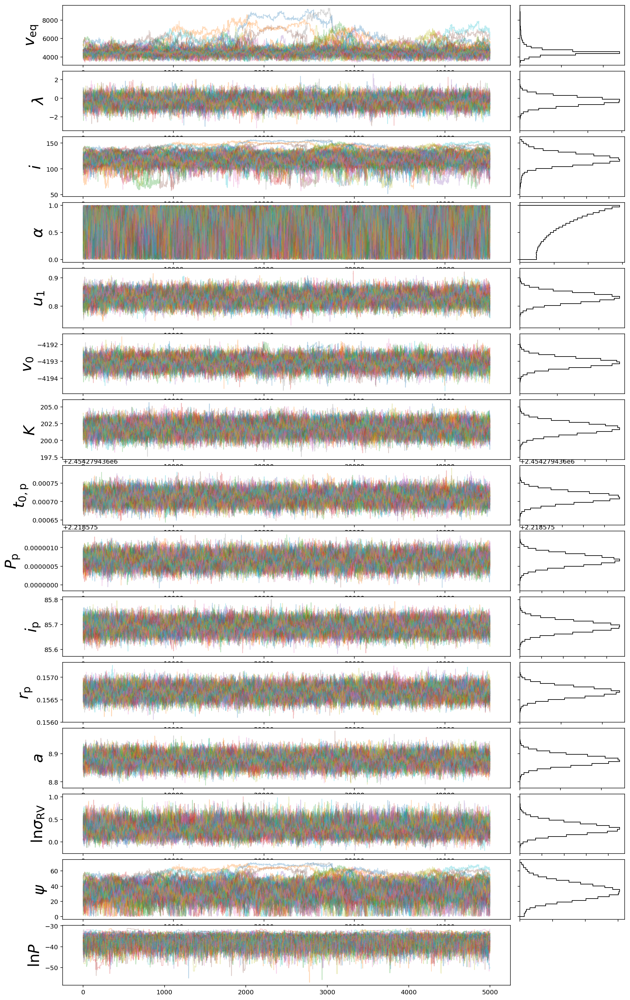

In [11]:
# Plot the chains
nburn = 5000
fig = pl.figure(figsize=(16, 24))
fig.subplots_adjust(bottom=0.05, top=0.95, hspace=0.1)
axc = [pl.subplot2grid((ndim + 1, 10), (n, 0), colspan=8, rowspan=1)
       for n in range(ndim + 1)]
axh = [pl.subplot2grid((ndim + 1, 10), (n, 8), colspan=2,
                       rowspan=1, sharey=axc[n]) for n in range(ndim + 1)]
alpha = 0.3
for i, label in enumerate(labels):
    for k in range(nwalk):
        axc[i].plot(chain[k, nburn:, i], alpha=alpha, lw=1)
        axc[i].set_ylabel(label, fontsize=24)
    axh[i].hist(chain[:, nburn:, i].flatten(), bins=30,
                orientation="horizontal", histtype='step',
                fill=False, color='k', lw=1)
    pl.setp(axh[i].get_yticklabels(), visible=False)
    pl.setp(axh[i].get_xticklabels(), visible=False)
# Plot the likelihood
for k in range(nwalk):
    axc[-1].plot(lnprobability[k, nburn:10000], alpha=alpha, lw=1)
    axc[-1].set_ylabel(r"$\ln P$", fontsize=24)
axh[-1].axis('off')
pl.setp(axh[-1].get_yticklabels(), visible=False)
pl.setp(axh[-1].get_xticklabels(), visible=False);

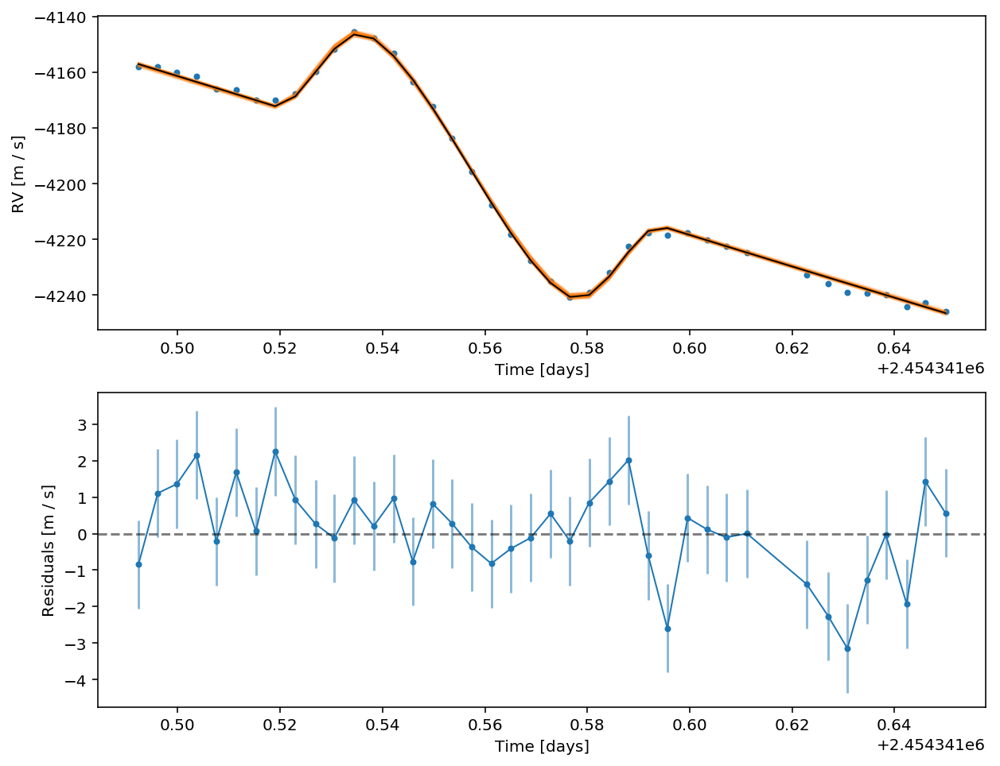

In [13]:
# Plot the data + model
fig, ax = pl.subplots(2, 1, figsize=(10, 8))
ax[0].plot(time, rv, '.')
ax[0].set_xlabel("Time [days]")
ax[0].set_ylabel("RV [m / s]");

# Plot 100 random samples
for i in range(100):
    idx = np.random.randint(0, nwalk * nsteps)
    model = compute(sampler.flatchain[idx])
    ax[0].plot(time, model, color='C1', alpha=0.1, lw=1)

# Plot the max like model
idx = np.argmax(sampler.flatlnprobability)
model = compute(sampler.flatchain[idx])
ax[0].plot(time, model, color='k', lw=1);

# Plot the residuals
err = np.ones_like(time) * np.exp(sampler.flatchain[idx][12])
ax[1].plot(time, rv - model, '.');
ax[1].plot(time, rv - model, '-', color='C0', lw=1);
ax[1].errorbar(time, rv - model, err, fmt='none', color='C0', alpha=0.5)
ax[1].axhline(0, color='k', ls='--', alpha=0.5);
ax[1].set_xlabel("Time [days]")
ax[1].set_ylabel("Residuals [m / s]");

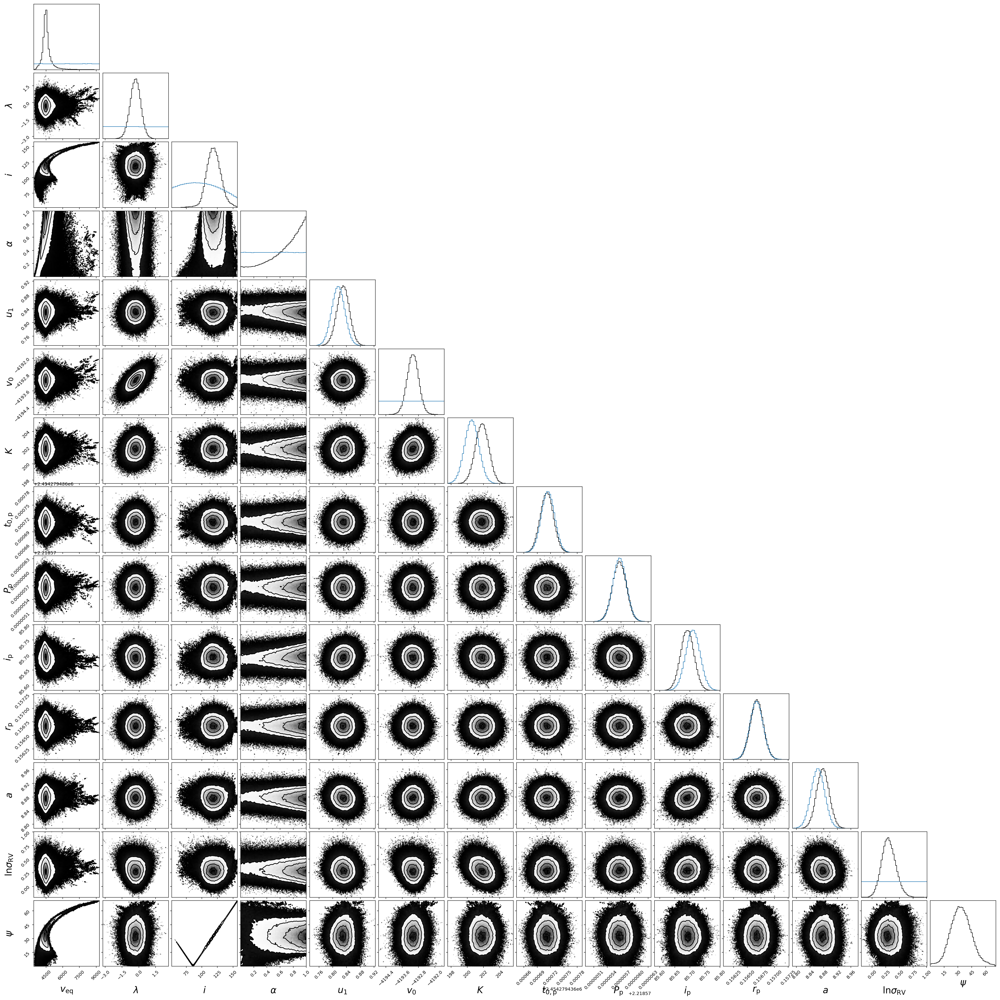

In [14]:
# Plot the corner plot for all params
samples = chain[:, nburn:, :].reshape(nwalk * (nsteps - nburn), ndim)
fig = corner.corner(samples, labels=labels, bins=50);

# Plot the priors
for ind in range(ndim):
    if ind < len(prior.params):
        x = np.array([getattr(prior, prior.params[ind]).sample() 
                      for i in range(len(samples))])
        ax = fig.axes[(ndim + 1) * ind]
        n, _, _ = ax.hist(x, bins=50, weights=None,
                          range=np.sort([x.min(), x.max()]),
                          histtype="step", color="C0")
            
for ax in fig.axes:
    ax.xaxis.label.set_fontsize(20)
    ax.yaxis.label.set_fontsize(20)

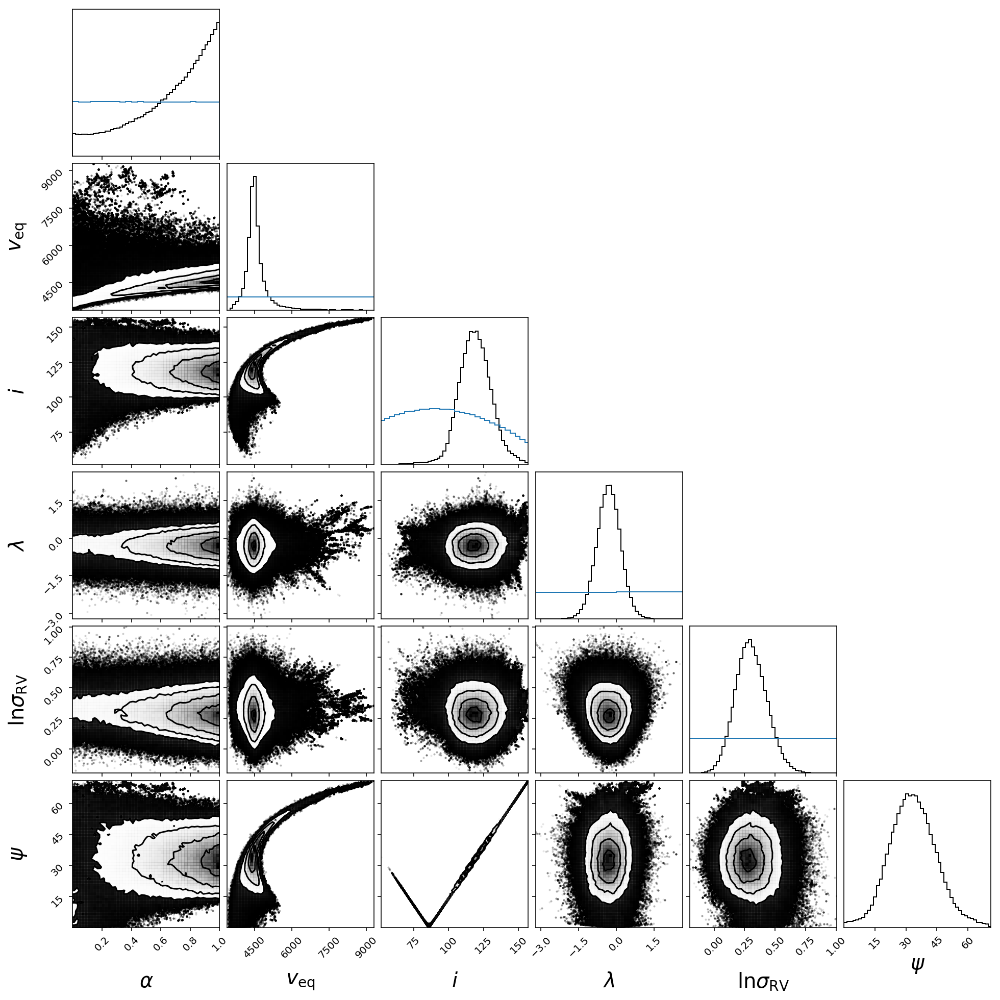

In [15]:
# Reproduce Figure 4 in Cegla et al.
inds = [3, 0, 2, 1, 12, 13]
samples_cegla = np.array([samples[:, inds[0]],
                          samples[:, inds[1]],
                          samples[:, inds[2]],
                          samples[:, inds[3]],
                          samples[:, inds[4]],
                          samples[:, inds[5]]]).T
labels_cegla = [labels[3], labels[0], labels[2], labels[1], labels[12], labels[13]]

# Corner plot
fig = corner.corner(samples_cegla, labels=labels_cegla, bins=50);

# Plot the priors
for i, ind in enumerate(inds):
    if ind < len(prior.params):
        x = np.array([getattr(prior, prior.params[ind]).sample() 
                      for i in range(len(samples_cegla))])
        ax = fig.axes[7 * i]
        n, _, _ = ax.hist(x, bins=50, weights=None,
                          range=np.sort([x.min(), x.max()]),
                          histtype="step")
    
for ax in fig.axes:
    ax.xaxis.label.set_fontsize(20)
    ax.yaxis.label.set_fontsize(20)

**Compare this to:**



![](cegla_fig4.png)